In [1]:
import os
print(os.getcwd())

d:\ENSAE Paris\3A\S1\ML_Climate_risk\PROJET\ML_For_Climate_risk\ML-for-Climate-Risk\ANA_EXPLO


In [2]:
import pandas as pd

data1 = pd.read_csv("../data/data_cleaned.csv", sep=",")
data1.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_14792\1002277007.py:3: DtypeWarning: Columns (6,10) have mixed types. Specify dtype option on import or set low_memory=False.
  data1 = pd.read_csv("../data/data_cleaned.csv", sep=",")


,NUMERO,LAMBX_93,LAMBY_93,LAMBX_2,LAMBY_2,ANNEE,code_insee_commune,commune,code_insee_de_la_region,region,...,WG_RACINE_03,WG_RACINE_04,WG_RACINE_05,WG_RACINE_06,WG_RACINE_07,WG_RACINE_08,WG_RACINE_09,WG_RACINE_10,WG_RACINE_11,WG_RACINE_12
0,1860,111467,6838785,60000,2401000,2000,29084,Île-Molène,53,Bretagne,...,0.30,0.30,0.30,0.29,0.28,0.26,0.25,0.28,0.31,0.32
1,2477,127137,6798687,76000,2361000,2000,29168,Plogoff,53,Bretagne,...,0.23,0.24,0.23,0.22,0.19,0.18,0.18,0.21,0.25,0.27
2,1984,127392,6830663,76000,2393000,2000,29190,Plougonvelin,53,Bretagne,...,0.29,0.29,0.29,0.27,0.25,0.23,0.23,0.26,0.30,0.32
3,1861,127455,6838657,76000,2401000,2000,29201,Ploumoguer,53,Bretagne,...,0.30,0.31,0.30,0.29,0.27,0.25,0.24,0.28,0.32,0.33
4,1737,127519,6846652,76000,2409000,2000,29098,Lampaul-Plouarzel,53,Bretagne,...,0.30,0.31,0.30,0.29,0.27,0.24,0.24,0.28,0.32,0.33


In [3]:
data1.isna().any().any()

np.False_

## B. Quantitative Analysis

### 1) Quelques stat des de base sur le Swi et le swi uniforme

In [4]:
import pandas as pd
import numpy as np

# Liste des colonnes SWI et SWI Uniforme
swi_cols = [col for col in data1.columns if col.startswith("SWI_")]
swi_unif_cols = [col for col in data1.columns if col.startswith("swi_unif_")]

def summary_stats(df, cols, label):
    stats = df[cols].agg(['mean', 'std', 'min', 'max'])
    print(f"--- Statistiques {label} ---")
    print(stats)

summary_stats(data1, swi_cols, "SWI")
summary_stats(data1, swi_unif_cols, "SWI Uniforme")

--- Statistiques SWI ---
        SWI_01    SWI_02    SWI_03    SWI_04    SWI_05    SWI_06    SWI_07  \
mean  0.893355  0.896311  0.860321  0.765978  0.694463  0.559428  0.422304   
std   0.142566  0.124002  0.126404  0.160311  0.201196  0.216694  0.194824   
min   0.000000  0.000000  0.060000  0.040000  0.050000  0.010000 -0.020000   
max   1.420000  1.390000  1.400000  1.610000  2.060000  1.920000  1.730000   

       SWI_08    SWI_09    SWI_10    SWI_11    SWI_12  
mean  0.36418  0.374694  0.502589  0.696612  0.830030  
std   0.18886  0.193222  0.223787  0.227008  0.178823  
min  -0.07000 -0.050000 -0.020000  0.010000  0.010000  
max   1.65000  1.530000  1.510000  1.480000  1.430000  
--- Statistiques SWI Uniforme ---
      swi_unif_01  swi_unif_02  swi_unif_03  swi_unif_04  swi_unif_05  \
mean     0.879914     0.916113     0.896871     0.798428     0.697554   
std      0.189670     0.150933     0.138968     0.163672     0.204570   
min     -0.007000    -0.006000     0.014000    -0.0

In [6]:
import pandas as pd

# Colonnes SWI
swi_cols = [col for col in data1.columns if col.startswith("SWI_")]
swi_unif_cols = [col for col in data1.columns if col.startswith("swi_unif_")]

# Empiler toutes les valeurs SWI dans un seul vecteur
swi_all = data1[swi_cols].stack()
swi_unif_all = data1[swi_unif_cols].stack()

# Statistiques globales
result = pd.DataFrame({
    "mean": [swi_all.mean(), swi_unif_all.mean()],
    "std":  [swi_all.std(),  swi_unif_all.std()],
    "min":  [swi_all.min(),  swi_unif_all.min()],
    "max":  [swi_all.max(),  swi_unif_all.max()],
    "median":  [swi_all.median(),  swi_unif_all.median()]
}, index=["SWI_global", "SWI_uniforme_global"])

print(result)


                         mean       std    min   max  median
SWI_global           0.655022  0.268090 -0.070  2.06   0.690
SWI_uniforme_global  0.594316  0.333115 -0.049  1.54   0.635


Le SWI moyen de 2000 à 2004 est de 0.655, avec une valeur minimale de -0.07,  une valeur maximale de 2.06.
Le swi uniforme quant à lui varie de -0.049 à 1.54 avec une valeur moyenne de 0.59.
Le swi uniforme sur l'ensemble est plus volatile (écart-type de 0.333) que le simple SWI classique (écart type de 0.268090).

### 2) Evolution temporelle du SWI

### a) Tendance au cours des années

In [7]:
# Pour chaque année, moyenne SWI toutes communes/points confondus
annual_swi_unif = data1.groupby("ANNEE")[swi_unif_cols].mean()
annual_swi_unif["SWI_moyenne"] = annual_swi_unif.mean(axis=1)

print("--- Évolution annuelle de SWI ---")
print(annual_swi_unif["SWI_moyenne"])

--- Évolution annuelle de SWI ---
ANNEE
2000    0.706048
2001    0.668645
2002    0.624198
2003    0.524491
2004    0.584418
2005    0.510116
2006    0.581748
2007    0.594656
2008    0.637527
2009    0.542354
2010    0.608918
2011    0.489325
2012    0.634681
2013    0.699791
2014    0.656144
2015    0.552586
2016    0.610761
2017    0.503373
2018    0.573881
2019    0.583182
2020    0.574642
2021    0.629931
2022    0.463497
2023    0.579521
2024    0.723456
Name: SWI_moyenne, dtype: float64


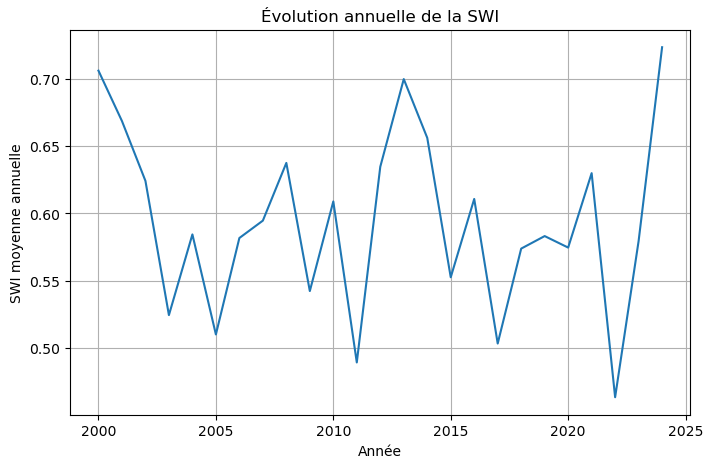

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calcul SWI annuelle (comme précédemment)
annual_swi_unif = data1.groupby("ANNEE")[swi_unif_cols].mean()
annual_swi_unif["swi_unif_moy"] = annual_swi_unif.mean(axis=1)

plt.figure(figsize=(8,5))
#sns.scatterplot(x=annual_swi_unif.index, y=annual_swi_unif["swi_unif_moy"])

sns.lineplot(x=annual_swi_unif.index, y=annual_swi_unif["swi_unif_moy"])
plt.xlabel("Année")
plt.ylabel("SWI moyenne annuelle")
plt.title("Évolution annuelle de la SWI")
plt.grid(True)
plt.show()

On constate à partir du graphe que les années 2012, 2017 et 2022 ont des swi plus bas, ce qui traduit une tendance vers la 
sécheresse.  Par contre avant 2010, la valeur minimale annuelle est à 0.6 correspondant à 2005.  Du coup avant 2010,
la valeur moyenne du SWI est au moins de 0.6, traduisant ainsi une sécheresse moins prononcée. Ce qui n'est pas le cas après 2010.

#### a1) Evolution du SWI au cours  du temps

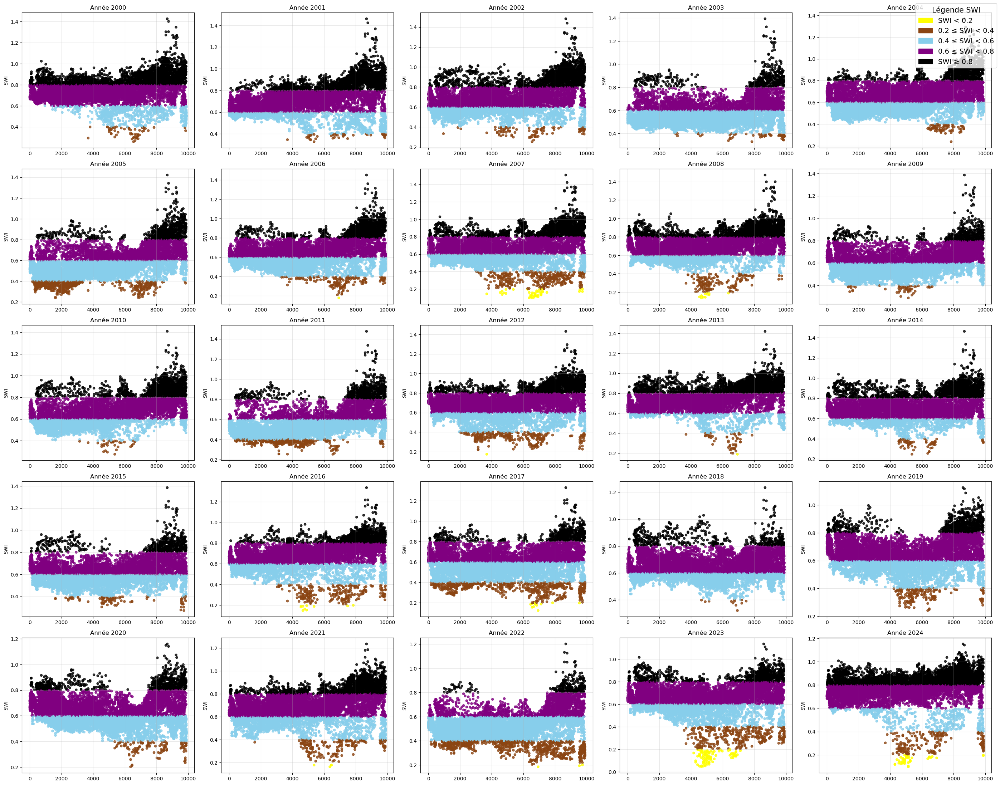

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

#---------------------------
# 1. Préparer le SWI annuel
#---------------------------
swi_cols = [col for col in data1.columns if col.startswith("SWI_")]
data1["SWI_annual"] = data1[swi_cols].mean(axis=1)

annees = sorted(data1["ANNEE"].unique())

#---------------------------
# 2. Fonction couleur par intervalle
#---------------------------
def assign_color(value):
    if value < 0.2:
        return "yellow"
    elif value < 0.4:
        return "saddlebrown"
    elif value < 0.6:
        return "skyblue"
    elif value < 0.8:
        return "purple"
    else:
        return "black"

#---------------------------
# 3. Grille 5 × 5
#---------------------------
fig, axes = plt.subplots(5, 5, figsize=(28, 22))
axes = axes.flatten()

#---------------------------
# 4. Boucle par année
#---------------------------
for i, an in enumerate(annees[:25]):
    ax = axes[i]
    df_year = data1[data1["ANNEE"] == an]

    y = df_year["SWI_annual"].values
    x = np.arange(len(y))

    # couleurs pour chaque point
    colors = [assign_color(v) for v in y]

    ax.scatter(x, y, c=colors, s=20, alpha=0.8)
    ax.set_title(f"Année {an}", fontsize=12)
    ax.set_ylabel("SWI", fontsize=10)
    ax.grid(True, alpha=0.3)

# cases vides
for j in range(len(annees), 25):
    fig.delaxes(axes[j])

#---------------------------
# 5. Légende personnalisée
#---------------------------
legend_elements = [
    mpatches.Patch(color="yellow", label="SWI < 0.2"),
    mpatches.Patch(color="saddlebrown", label="0.2 ≤ SWI < 0.4"),
    mpatches.Patch(color="skyblue", label="0.4 ≤ SWI < 0.6"),
    mpatches.Patch(color="purple", label="0.6 ≤ SWI < 0.8"),
    mpatches.Patch(color="black", label="SWI ≥ 0.8")
]

fig.legend(
    handles=legend_elements,
    loc="upper right",
    fontsize=14,
    title="Légende SWI",
    title_fontsize=15
)

plt.tight_layout()
plt.show()


| Classe que tu définis  | Intervalle SWI (proposé) | Signification (approximative)                     |
| ---------------------- | ------------------------ | ------------------------------------------------- |
| Très sec / stress fort | SWI < 0.2                | Sol très sec, stress hydrique fort                |
| Sec / stress modéré    | 0.2 ≤ SWI < 0.4          | Sol sec, mais pas critique                        |
| Moyenne / « normale »  | 0.4 ≤ SWI < 0.6          | Hydratation moyenne (ni trop sec, ni trop humide) |
| Humidité correcte      | 0.6 ≤ SWI < 1.0          | Bonne réserve en eau                              |
| Sol saturé / humide    | SWI ≥ 1.0                | Sol saturé, risque de ruissellement ou saturation |


#### a2) Evolution du swi uniforme au cours du temps

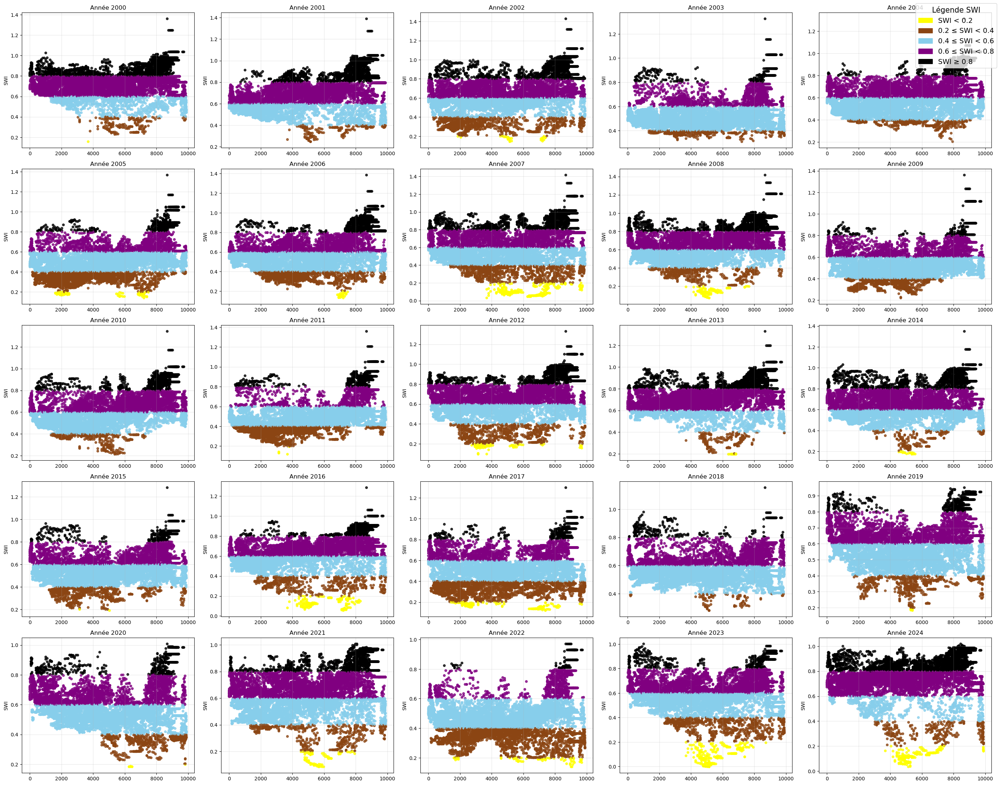

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

#---------------------------
# 1. Préparer le SWI annuel
#---------------------------
swi_unif_cols = [col for col in data1.columns if col.startswith("swi_unif_")]
data1["SWI_unif_annual"] = data1[swi_unif_cols].mean(axis=1)

annees = sorted(data1["ANNEE"].unique())

#---------------------------
# 2. Fonction couleur par intervalle
#---------------------------
def assign_color(value):
    if value < 0.2:
        return "yellow"
    elif value < 0.4:
        return "saddlebrown"
    elif value < 0.6:
        return "skyblue"
    elif value < 0.8:
        return "purple"
    else:
        return "black"

#---------------------------
# 3. Grille 5 × 5
#---------------------------
fig, axes = plt.subplots(5, 5, figsize=(28, 22))
axes = axes.flatten()

#---------------------------
# 4. Boucle par année
#---------------------------
for i, an in enumerate(annees[:25]):
    ax = axes[i]
    df_year = data1[data1["ANNEE"] == an]

    y = df_year["SWI_unif_annual"].values
    x = np.arange(len(y))

    # couleurs pour chaque point
    colors = [assign_color(v) for v in y]

    ax.scatter(x, y, c=colors, s=20, alpha=0.8)
    ax.set_title(f"Année {an}", fontsize=12)
    ax.set_ylabel("SWI", fontsize=10)
    ax.grid(True, alpha=0.3)

# cases vides
for j in range(len(annees), 25):
    fig.delaxes(axes[j])

#---------------------------
# 5. Légende personnalisée
#---------------------------
legend_elements = [
    mpatches.Patch(color="yellow", label="SWI < 0.2"),
    mpatches.Patch(color="saddlebrown", label="0.2 ≤ SWI < 0.4"),
    mpatches.Patch(color="skyblue", label="0.4 ≤ SWI < 0.6"),
    mpatches.Patch(color="purple", label="0.6 ≤ SWI < 0.8"),
    mpatches.Patch(color="black", label="SWI ≥ 0.8")
]

fig.legend(
    handles=legend_elements,
    loc="upper right",
    fontsize=14,
    title="Légende SWI",
    title_fontsize=15
)

plt.tight_layout()
plt.show()


### b) Explore monthly patterns (e.g., which months are driest).

Calcul de quelques statistiques  de SWI mensuels

In [11]:
# On suppose SWI_01, ..., SWI_12 pour janvier à décembre
monthly_stats = data1[swi_unif_cols].agg(['mean', 'min', 'max']).T
monthly_stats.index = monthly_stats.index.str.extract(r'(\d{2})')[0]  # recupère '01'...'12'

print("--- Statistiques par mois (SWI Uniforme) ---")
print(monthly_stats)

--- Statistiques par mois (SWI Uniforme) ---
        mean    min    max
0                         
01  0.879914 -0.007  1.384
02  0.916113 -0.006  1.378
03  0.896871  0.014  1.373
04  0.798428 -0.017  1.376
05  0.697554 -0.012  1.500
06  0.514738 -0.030  1.539
07  0.324440 -0.041  1.540
08  0.222995 -0.048  1.518
09  0.210203 -0.043  1.485
10  0.337433 -0.049  1.519
11  0.569920 -0.016  1.446
12  0.763179 -0.011  1.396


#### b1) Représentation du SWI uniforme mensuel moyen de 2000 à 2024.

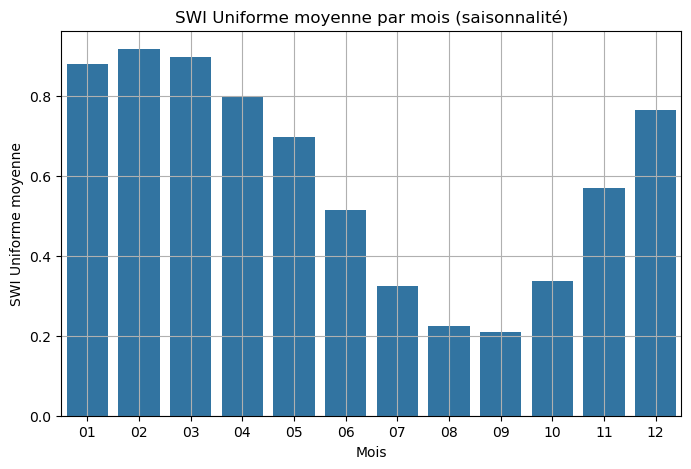

In [12]:
monthly_means = data1[swi_unif_cols].mean()
mois_labels = [str(i).zfill(2) for i in range(1,13)]

plt.figure(figsize=(8,5))
sns.barplot(x=mois_labels, y=monthly_means.values)
plt.xlabel("Mois")
plt.ylabel("SWI Uniforme moyenne")
plt.title("SWI Uniforme moyenne par mois (saisonnalité)")
plt.grid(True)
plt.show()

Le trimestre avec un risque de sécheresse accru est celui de juillet à septembre ; contrairement au triùestre de janvier à Mars avec les sols les plus humides.

Je veux calculer les valeurs moyennes sur chaque maille sur les 3 mois chauds [juillet, Aout, Septembre] (pour chacune de ces années prises individuellement : 2007, 2012, 2017,2023) Et je veux faire pareil pour les 3 mois les plus froids (janvier, février et Mars). Et je veux pour chaque année avoir 2 cartes de la France : une carte pqui va avoir les points des différentes mailles de3 mois chauds (Par exemple pour 2007, la maille A sera représenté par la moyenne des swi de la maille A sur les 3 mois chauds de 2007 ; ainsi de suite pour toutes les mailles.) Maintenant les couleurs des points va varier de plus concentré pour les faibles valeurs de swi uniforme , à moins degradé (valeurs de swi élevées) Je veux pareil pour les 3 mois froids. Donc par années j'aurai 2 cartes. Je veux sur une première ligne aveoir les 4 cartes des 4 années choisi pour les 4 anneés pour les mois chauds. Sur la deuxième ligne, pareil pour les mois froids.

#### b2) Evolution du swi uniforme sur les trimestres chauds et froids 

C:\Users\USER\AppData\Local\Temp\ipykernel_14232\355818180.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])   # laisse de la place pour la légende


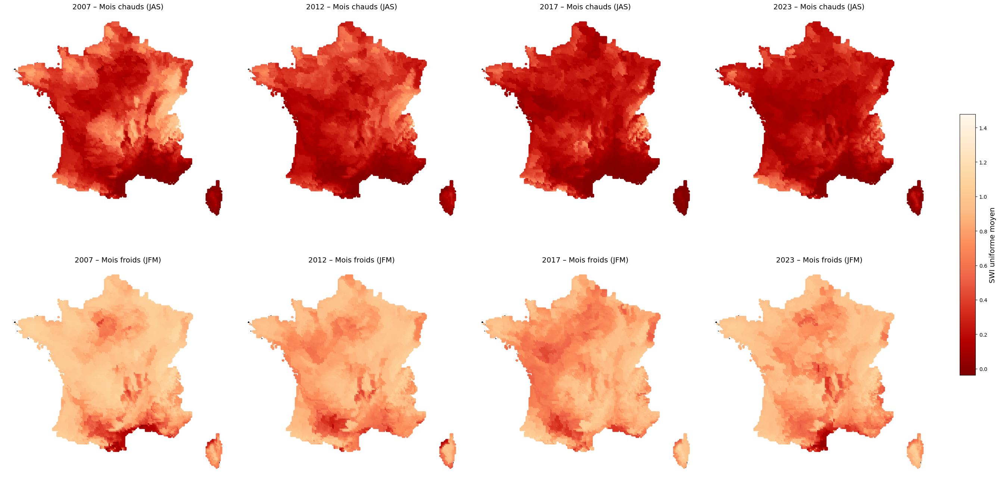

In [13]:
# ------------------------------------------------------------
# 0. Imports
# ------------------------------------------------------------
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# 1. Définition des paramètres
# ------------------------------------------------------------
annees_cible = [2007, 2012, 2017, 2023]
mois_chauds = [7, 8, 9]   # JAS
mois_froids = [1, 2, 3]   # JFM

# Palette inversée (rouge intense = sec)
cmap = "OrRd_r"

# ------------------------------------------------------------
# 2. Charger les départements
# ------------------------------------------------------------
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"
gdf_departement = gpd.read_file(LimitAdmin, layer="departement").to_crs(2154)

# ------------------------------------------------------------
# 3. Préparation des données long-form SWI uniforme
# ------------------------------------------------------------
df = data1[data1["ANNEE"].isin(annees_cible)].copy()

swi_unif_cols = [c for c in df.columns if c.startswith("swi_unif_") and c[-2:].isdigit()]

df_long = df.melt(
    id_vars=[c for c in df.columns if c not in swi_unif_cols],
    value_vars=swi_unif_cols,
    var_name="var",
    value_name="SWI_uniforme"
)

df_long["mois"] = df_long["var"].str.extract(r"swi_unif_(\d{2})", expand=False).astype(int)

# ------------------------------------------------------------
# 4. Calcul des SWI moyens par maille
# ------------------------------------------------------------
df_chaud = (
    df_long[df_long["mois"].isin(mois_chauds)]
    .groupby(["ANNEE", "NUMERO"])[["SWI_uniforme"]]
    .mean()
    .reset_index()
)

df_froid = (
    df_long[df_long["mois"].isin(mois_froids)]
    .groupby(["ANNEE", "NUMERO"])[["SWI_uniforme"]]
    .mean()
    .reset_index()
)

# ------------------------------------------------------------
# 5. Création GeoDataFrame des mailles
# ------------------------------------------------------------
gdf_points = gpd.GeoDataFrame(
    df_long,
    geometry=gpd.points_from_xy(df_long["LAMBX_93"], df_long["LAMBY_93"]),
    crs=2154
)

gdf_maille = gdf_points[["NUMERO", "geometry"]].drop_duplicates()

# ------------------------------------------------------------
# 6. Détermination des bornes globales SWI pour la colorbar
# ------------------------------------------------------------
valeurs_globales = pd.concat([df_chaud["SWI_uniforme"], df_froid["SWI_uniforme"]])
vmin = valeurs_globales.min()
vmax = valeurs_globales.max()

# ------------------------------------------------------------
# 7. Génération des 8 cartes
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 4, figsize=(28, 14), subplot_kw={'aspect': 'equal'})

for row, (df_mois, titre) in enumerate([(df_chaud, "Mois chauds (JAS)"),
                                        (df_froid, "Mois froids (JFM)")]):
    for col, an in enumerate(annees_cible):

        ax = axes[row, col]

        # Fond administratif
        gdf_departement.plot(ax=ax, color="white", edgecolor="black", linewidth=0.4)

        # Données de l'année
        df_an = df_mois[df_mois["ANNEE"] == an]

        # Jointure
        gdf_plot = gdf_maille.merge(df_an, on="NUMERO", how="inner")

        # Scatter géographique
        gdf_plot.plot(
            ax=ax,
            column="SWI_uniforme",
            cmap=cmap,
            markersize=13,
            legend=False,
            vmin=vmin,
            vmax=vmax
        )

        ax.set_title(f"{an} – {titre}", fontsize=14)
        ax.set_axis_off()

# ------------------------------------------------------------
# 8. Ajout de la légende COLORBAR commune
# ------------------------------------------------------------
# Create an invisible axis for the colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])  # position (x,y,w,h)

# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []  # required hack for older versions of matplotlib

cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("SWI uniforme moyen", fontsize=14)

plt.tight_layout(rect=[0, 0, 0.9, 1])   # laisse de la place pour la légende

plt.show()


### C1) Perform regional aggregation (mean SWI by region, month, or year).

Stats par région du Swi et du swi uniforme

In [15]:
stats_region = data1.groupby("region")[["SWI_annual", "SWI_unif_annual"]].agg(["mean", "min", "max", "std"])
print(stats_region)

                           SWI_annual                                \
                                 mean       min       max       std   
region                                                                
Auvergne-Rhône-Alpes         0.724294  0.260833  1.505833  0.150788   
Bourgogne-Franche-Comté      0.716823  0.390833  1.079167  0.123288   
Bretagne                     0.630453  0.335833  0.925833  0.095275   
Centre-Val de Loire          0.606217  0.292500  0.928333  0.095588   
Corse                        0.541134  0.171667  0.887500  0.129725   
Grand Est                    0.718828  0.381667  1.140000  0.125626   
Hauts-de-France              0.641809  0.312500  0.947500  0.096816   
Normandie                    0.641517  0.350833  0.950833  0.088670   
Nouvelle-Aquitaine           0.653383  0.239167  1.042500  0.112917   
Occitanie                    0.605048  0.043333  1.051667  0.140113   
Pays de la Loire             0.566170  0.287500  0.960000  0.091315   
Proven

Occitanie, Ile de France, Corce et Provence-Alpes-Cote d'Azur sont les régions avec les vakleurs de SWI uniformes
moyennes les plus basses, donc les plus exposées à la sécheresse.
Par contre les régions avec le SWI le plus volatiles sont : Auvergnes- Rhones-Alpes et Provence-Alpes-Cote d'Azur.

Stats du Swi et du swi uniforme par année

In [16]:
stats_annee = data1.groupby("ANNEE")[["SWI_annual", "SWI_unif_annual"]].agg(["mean", "min", "max", "std"])
print(stats_annee)


      SWI_annual                               SWI_unif_annual            \
            mean       min       max       std            mean       min   
ANNEE                                                                      
2000    0.745134  0.259167  1.425833  0.109806        0.706048  0.157250   
2001    0.720079  0.328333  1.460000  0.122276        0.668645  0.245917   
2002    0.686641  0.254167  1.482500  0.136726        0.624198  0.142583   
2003    0.580512  0.330000  1.392500  0.107314        0.524491  0.309583   
2004    0.644808  0.238333  1.369167  0.123525        0.584418  0.203333   
2005    0.586446  0.239167  1.420833  0.138123        0.510116  0.139667   
2006    0.648324  0.179167  1.451667  0.134873        0.581748  0.130750   
2007    0.656260  0.097500  1.505833  0.153823        0.594656  0.030667   
2008    0.697701  0.137500  1.471667  0.131656        0.637527  0.070833   
2009    0.610234  0.287500  1.385833  0.109184        0.542354  0.220500   
2010    0.66

C:\Users\USER\AppData\Local\Temp\ipykernel_14232\1464024967.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 1])


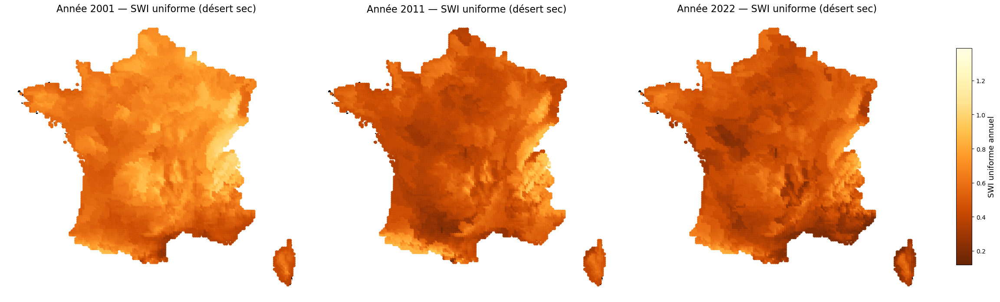

In [17]:
# ------------------------------------------------------------
# 0. Imports
# ------------------------------------------------------------
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# ------------------------------------------------------------
# 1. Paramètres
# ------------------------------------------------------------
annees_cible = [2001, 2011, 2022]

# Palette désertique (faibles valeurs = très foncé)
cmap = "YlOrBr_r"

# ------------------------------------------------------------
# 2. Charger les couches administratives
# ------------------------------------------------------------
gdf_region = gpd.read_file(LimitAdmin, layer="region").to_crs(2154)
gdf_departement = gpd.read_file(LimitAdmin, layer="departement").to_crs(2154)

# ------------------------------------------------------------
# 3. Préparation des points des mailles
# ------------------------------------------------------------
df = data1[data1["ANNEE"].isin(annees_cible)].copy()

gdf_points = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["LAMBX_93"], df["LAMBY_93"]),
    crs=2154
)

# ------------------------------------------------------------
# 4. Bornes de la légende (constantes sur les 3 cartes)
# ------------------------------------------------------------
vmin = df["SWI_unif_annual"].min()
vmax = df["SWI_unif_annual"].max()

# ------------------------------------------------------------
# 5. Création des cartes
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(24, 10), subplot_kw={"aspect": "equal"})

for i, an in enumerate(annees_cible):

    ax = axes[i]

    # Sous-base de l'année
    gdf_an = gdf_points[gdf_points["ANNEE"] == an]

    # --- Départements (gris clair, pour sentir les zones)
    gdf_departement.plot(ax=ax, color="none", edgecolor="lightgrey", linewidth=0.4)

    # --- Régions (noir, contour plus net)
    gdf_region.plot(ax=ax, color="none", edgecolor="black", linewidth=1.0)

    # --- Points de SWI uniforme
    gdf_an.plot(
        ax=ax,
        column="SWI_unif_annual",
        cmap=cmap,
        markersize=20,
        legend=False,
        vmin=vmin,
        vmax=vmax,
        alpha=0.95
    )

    ax.set_title(f"Année {an} — SWI uniforme (désert sec)", fontsize=16)
    ax.set_axis_off()

# ------------------------------------------------------------
# 6. Légende commune
# ------------------------------------------------------------
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.50])

sm = plt.cm.ScalarMappable(
    cmap=cmap,
    norm=plt.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("SWI uniforme annuel", fontsize=13)

plt.tight_layout(rect=[0, 0, 0.90, 1])
plt.show()


C:\Users\USER\AppData\Local\Temp\ipykernel_14248\1481507769.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 1])


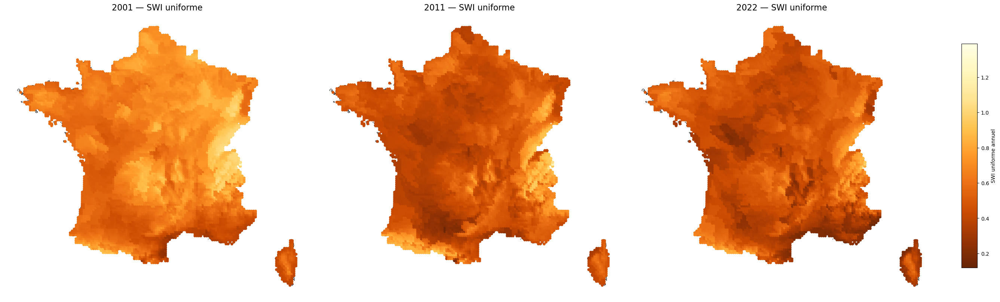

In [69]:
# ------------------------------------------------------------
# 0. Imports
# ------------------------------------------------------------
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# 1. Année pour le fond choroplèthe régional
# ------------------------------------------------------------
annee_fond = 2022            # année utilisée pour colorer les régions
annees_cible = [2001, 2011, 2022]   # années pour les points SWI

# palette désertique pour les points SWI
cmap_points = "YlOrBr_r"

# palette choroplèthe régionale (comme ton exemple) 
cmap_regions = "YlOrRd_r"   # très proche de ton image

# ------------------------------------------------------------
# 2. Charger les couches administratives
# ------------------------------------------------------------
gdf_region = gpd.read_file(LimitAdmin, layer="region").to_crs(2154)
gdf_departement = gpd.read_file(LimitAdmin, layer="departement").to_crs(2154)

# ------------------------------------------------------------
# 3. Calcul du SWI régional moyen (pour choroplèthe)
# ------------------------------------------------------------
df22 = data1[data1["ANNEE"] == annee_fond].copy()
df22_region = df22.groupby("region")["SWI_unif_annual"].mean().reset_index()
df22_region.rename(columns={"SWI_unif_annual": "SWI_region"}, inplace=True)

# joindre les valeurs aux polygones régionaux
gdf_region_colored = gdf_region.merge(df22_region, left_on="nom_officiel", right_on="region", how="left")

# ------------------------------------------------------------
# 4. Préparation des points
# ------------------------------------------------------------
df_points = data1[data1["ANNEE"].isin(annees_cible)].copy()

gdf_points = gpd.GeoDataFrame(
    df_points,
    geometry=gpd.points_from_xy(df_points["LAMBX_93"], df_points["LAMBY_93"]),
    crs=2154
)

vmin = df_points["SWI_unif_annual"].min()
vmax = df_points["SWI_unif_annual"].max()

# ------------------------------------------------------------
# 5. Création des cartes
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(28, 12), subplot_kw={"aspect": "equal"})

for k, an in enumerate(annees_cible):

    ax = axes[k]

    # ----------------- FOND : CHOROPLETHE RÉGIONALE -----------------
    gdf_region_colored.plot(
        ax=ax,
        column="SWI_region",
        cmap=cmap_regions,
        legend=False,
        linewidth=1.5,
        edgecolor="black"
    )

    # ----------------- DÉPARTEMENTS -----------------
    gdf_departement.plot(
        ax=ax,
        color="none",
        edgecolor="white",
        linewidth=0.4
    )

    # ----------------- POINTS SWI -----------------
    gdf_points[gdf_points["ANNEE"] == an].plot(
        ax=ax,
        column="SWI_unif_annual",
        cmap=cmap_points,
        markersize=20,
        legend=False,
        vmin=vmin,
        vmax=vmax
    )

    ax.set_title(f"{an} — SWI uniforme", fontsize=16)
    ax.set_axis_off()

# ------------------------------------------------------------
# 6. Légende continue des POINTS SWI
# ------------------------------------------------------------
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.50])
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap=cmap_points)
sm._A = []
plt.colorbar(sm, cax=cbar_ax, label="SWI uniforme annuel")

plt.tight_layout(rect=[0, 0, 0.90, 1])
plt.show()


## Focus sur 2022

C:\Users\USER\AppData\Local\Temp\ipykernel_14232\1762725391.py:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.90])


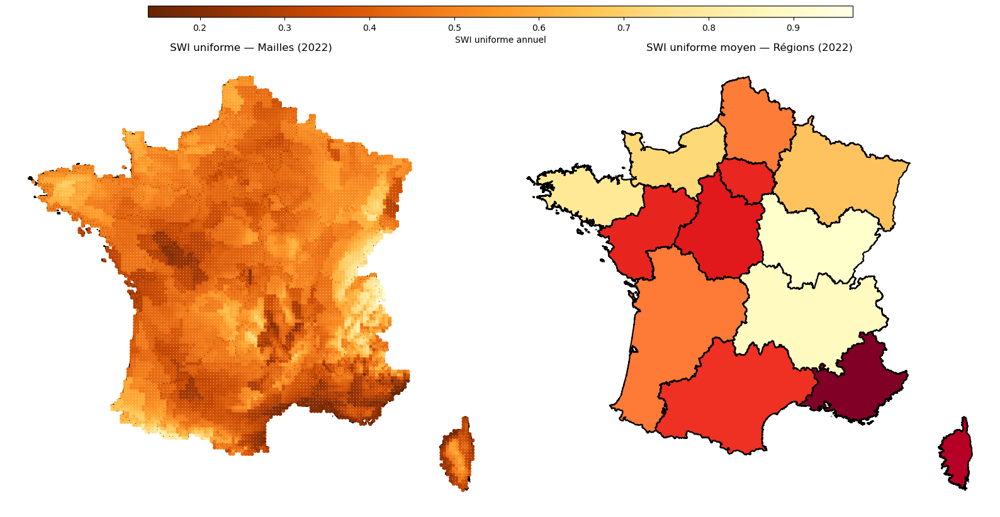

In [ ]:
# ------------------------------------------------------------
# 0. Imports
# ------------------------------------------------------------
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# 1. Paramètres
# ------------------------------------------------------------
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"

annee_carte = 2022                  # année à afficher
cmap_points = "YlOrBr_r"            # palette désertique pour les points
cmap_regions = "YlOrRd_r"           # choroplèthe régions (rouge → jaune)

code_reg_geom = "code_insee"               # identifiant région dans le shapefile
code_reg_data = "code_insee_de_la_region"  # identifiant région dans data1

# ------------------------------------------------------------
# 2. Charger la couche REGION
# ------------------------------------------------------------
gdf_region = gpd.read_file(LimitAdmin, layer="region").to_crs(2154)

# ------------------------------------------------------------
# 3. Points SWI pour l'année
# ------------------------------------------------------------
df_year = data1[data1["ANNEE"] == annee_carte].copy()

gdf_points_year = gpd.GeoDataFrame(
    df_year,
    geometry=gpd.points_from_xy(df_year["LAMBX_93"], df_year["LAMBY_93"]),
    crs=2154
)

vmin = df_year["SWI_unif_annual"].min()
vmax = df_year["SWI_unif_annual"].max()

# ------------------------------------------------------------
# 4. Calcul du SWI régional moyen
# ------------------------------------------------------------
df_region_swi = (
    df_year.groupby(code_reg_data)["SWI_unif_annual"]
    .mean()
    .reset_index()
    .rename(columns={"SWI_unif_annual": "SWI_region"})
)

# Harmoniser les types (INDISPENSABLE)
gdf_region[code_reg_geom] = gdf_region[code_reg_geom].astype(str)
df_region_swi[code_reg_data] = df_region_swi[code_reg_data].astype(str)

# Merge régions + statistiques
gdf_region_merged = gdf_region.merge(
    df_region_swi,
    left_on=code_reg_geom,
    right_on=code_reg_data,
    how="left"
)

# ------------------------------------------------------------
# 5. Figures
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 9), subplot_kw={"aspect": "equal"})
ax_points, ax_regions = axes

# ---- PANEL GAUCHE : POINTS SWI ----
gdf_region.plot(
    ax=ax_points,
    color="white",
    edgecolor="black",
    linewidth=1.5
)

gdf_points_year.plot(
    ax=ax_points,
    column="SWI_unif_annual",
    cmap=cmap_points,
    markersize=12,
    vmin=vmin,
    vmax=vmax,
    legend=False
)

ax_points.set_title(f"SWI uniforme — Mailles ({annee_carte})")
ax_points.set_axis_off()

# ---- PANEL DROIT : CHOROPLÈTHE RÉGIONS ----
gdf_region_merged.plot(
    ax=ax_regions,
    column="SWI_region",
    cmap=cmap_regions,
    edgecolor="black",
    linewidth=1.5,
    legend=False
)

ax_regions.set_title(f"SWI uniforme moyen — Régions ({annee_carte})")
ax_regions.set_axis_off()

# ------------------------------------------------------------
# 6. Colorbar horizontale (pour les points)
# ------------------------------------------------------------
cbar_ax = fig.add_axes([0.15, 0.92, 0.70, 0.02])
sm = plt.cm.ScalarMappable(
    cmap=cmap_points,
    norm=plt.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal")
cbar.set_label("SWI uniforme annuel")

plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()


C:\Users\USER\AppData\Local\Temp\ipykernel_14232\1173957658.py:139: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.90])


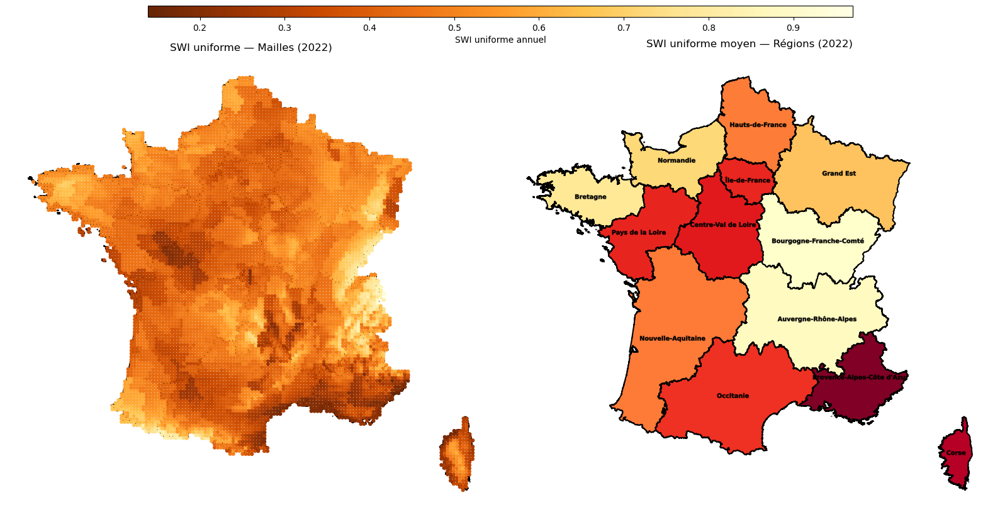

In [35]:
# ------------------------------------------------------------
# 0. Imports
# ------------------------------------------------------------
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patheffects as path_effects

# ------------------------------------------------------------
# 1. Paramètres
# ------------------------------------------------------------
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"

annee_carte = 2022
cmap_points = "YlOrBr_r"
cmap_regions = "YlOrRd_r"

code_reg_geom = "code_insee"
code_reg_data = "code_insee_de_la_region"

# ------------------------------------------------------------
# 2. Charger couche REGION
# ------------------------------------------------------------
gdf_region = gpd.read_file(LimitAdmin, layer="region").to_crs(2154)

# ------------------------------------------------------------
# 3. Points SWI année choisie
# ------------------------------------------------------------
df_year = data1[data1["ANNEE"] == annee_carte].copy()

gdf_points_year = gpd.GeoDataFrame(
    df_year,
    geometry=gpd.points_from_xy(df_year["LAMBX_93"], df_year["LAMBY_93"]),
    crs=2154
)

vmin = df_year["SWI_unif_annual"].min()
vmax = df_year["SWI_unif_annual"].max()

# ------------------------------------------------------------
# 4. SWI régional moyen
# ------------------------------------------------------------
df_region_swi = (
    df_year.groupby(code_reg_data)["SWI_unif_annual"]
    .mean()
    .reset_index()
    .rename(columns={"SWI_unif_annual": "SWI_region"})
)

gdf_region[code_reg_geom] = gdf_region[code_reg_geom].astype(str)
df_region_swi[code_reg_data] = df_region_swi[code_reg_data].astype(str)

gdf_region_merged = gdf_region.merge(
    df_region_swi,
    left_on=code_reg_geom,
    right_on=code_reg_data,
    how="left"
)

# ------------------------------------------------------------
# 5. Figures (2 panneaux)
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 9), subplot_kw={"aspect": "equal"})
ax_points, ax_regions = axes

# ---- PANEL GAUCHE : Points ----
gdf_region.plot(
    ax=ax_points,
    color="white",
    edgecolor="black",
    linewidth=1.5,
    legend=False
)

gdf_points_year.plot(
    ax=ax_points,
    column="SWI_unif_annual",
    cmap=cmap_points,
    markersize=12,
    vmin=vmin,
    vmax=vmax,
    legend=False
)

ax_points.set_title(f"SWI uniforme — Mailles ({annee_carte})")
ax_points.set_axis_off()

# ---- PANEL DROIT : Choroplèthe Régions ----
gdf_region_merged.plot(
    ax=ax_regions,
    column="SWI_region",
    cmap=cmap_regions,
    edgecolor="black",
    linewidth=1.5,
    legend=False
)

# -------- LABELS LISIBLES --------
col_nom_region = "nom_officiel"   # adapte si ton shapefile utilise un autre nom

for idx, row in gdf_region_merged.iterrows():
    if row.geometry is not None and row.geometry.representative_point().is_valid:
        x, y = row.geometry.representative_point().x, row.geometry.representative_point().y

        txt = ax_regions.text(
            x, y,
            row[col_nom_region],
            fontsize=7,
            fontweight="bold",
            ha="center",
            va="center",
            color="black"
        )

        txt.set_path_effects([
            path_effects.Stroke(linewidth=0.8, foreground="black", alpha=0.35),
            path_effects.Normal()
        ])

# Faire disparaître axes & cadre (évite le carré)
ax_regions.set_axis_off()

# Titre du panneau droit (après axis_off !)
ax_regions.set_title(f"SWI uniforme moyen — Régions ({annee_carte})", pad=10)

# ------------------------------------------------------------
# 6. Colorbar
# ------------------------------------------------------------
cbar_ax = fig.add_axes([0.15, 0.92, 0.70, 0.02])
sm = plt.cm.ScalarMappable(
    cmap=cmap_points,
    norm=plt.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal")
cbar.set_label("SWI uniforme annuel")

plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()


Carte statique du SWI uniforme moyen par région de 2000 à 2024

In [71]:
import pandas as pd
import matplotlib.pyplot as plt

# ---- 1. Garder les années 2020 à 2024 ----
df_swi_unif = data1[data1["ANNEE"].between(2000, 2024)].copy()

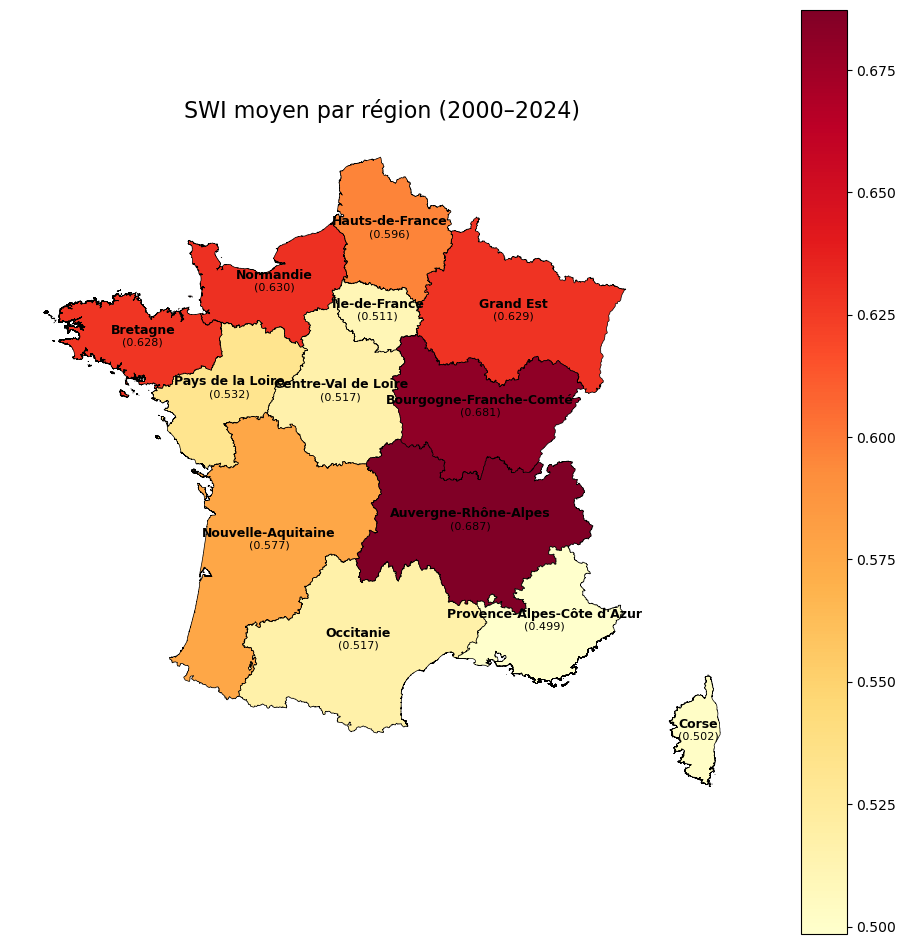

In [73]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---- 1. Calcul SWI moyen ----
df = df_swi_unif[df_swi_unif["ANNEE"].between(2000, 2024)].copy()

#swi_cols = [f"SWI_{str(i).zfill(2)}" for i in range(1, 13)]
df["swi_unif_moy"] = df[swi_unif_cols].mean(axis=1)

df_reg = (
    df.groupby("code_insee_de_la_region")["swi_unif_moy"]
    .mean()
    .reset_index()
)

df_reg["code_insee_de_la_region"] = df_reg["code_insee_de_la_region"].astype(str)

# ---- 2. Préparer la couche régionale ----
gdf = gdf_region.copy()
gdf["code_insee"] = gdf["code_insee"].astype(str)

gdf_map = gdf.merge(
    df_reg,
    left_on="code_insee",
    right_on="code_insee_de_la_region",
    how="inner"
)

gdf_map = gdf_map.to_crs(2154)

# ---- 3. Carte ----
fig, ax = plt.subplots(figsize=(12, 12))

gdf_map.plot(
    column="swi_unif_moy",
    cmap="YlOrRd",
    edgecolor="black",
    linewidth=0.5,
    legend=True,
    ax=ax
)

# ---- 4. Ajouter noms des régions + SWI moyen ----
for idx, row in gdf_map.iterrows():
    centroid = row.geometry.centroid
    region_name = row["nom_officiel"]
    swi_value = row["swi_unif_moy"]
    
    ax.text(
        centroid.x,
        centroid.y + 10000,  # petit décalage vers le haut
        region_name,
        ha="center",
        fontsize=9,
        fontweight="bold"
    )
    
    ax.text(
        centroid.x,
        centroid.y - 10000,  # petit décalage vers le bas
        f"({swi_value:.3f})",
        ha="center",
        fontsize=8,
        color="black"
    )

ax.set_title("SWI moyen par région (2000–2024)", fontsize=16)
ax.axis("off")

plt.show()

# FIN DE LA PARTIE B